In [2]:
import pytesseract
import cv2

In [3]:
image = cv2.imread("sample_mgh.JPG")
base_image = image.copy()

In [4]:
image.shape

(1672, 1236, 3)

In [5]:
# Function to display the image

import matplotlib.pyplot as plt

#https://stackoverflow.com/questions/28816046/
# Displaying different images with actual size in matplotlib

def display_image_original_size(im_data):
    
    # dpi stands for "dots per inches", it is a measure of the resolution of the image
    # In this it will be used to calculate the size of the figure needed to display the image at its actual size
    dpi = 80 
    
    # Get the height as number of rows(Image height in numpy array) and width as number of columns(Image width in the numpy array)
    # SHape function will give a tupe with number of rows, column and image type(RGB or not) we need only first 2 values for our function
    height, width = im_data.shape[:2]
    
    # what size does the figure need to be in inches to fit the image
    figsize = width / float(dpi), height/float(dpi)
    
    # Create a figure of the right size with oneaxes  that takes up the full figure
    fig = plt.figure(figsize=figsize) # Create new matplotlib figur with the specified size
    # Denotes the axes which the figure entirely occupy here, it startes from bottom-left corner(0,0) and goes upto top-right corner(1.1)
    ax = fig.add_axes([0,0,1,1])
    
    # Hide spines, ticks, etc.
    #This line removes the axis lines, ticks, and labels from the plot, making the image the sole focus of the display
    ax.axis('off')
    
    # Display the image in grayscale
    ax.imshow(im_data, cmap = 'gray')
    
    plt.show()

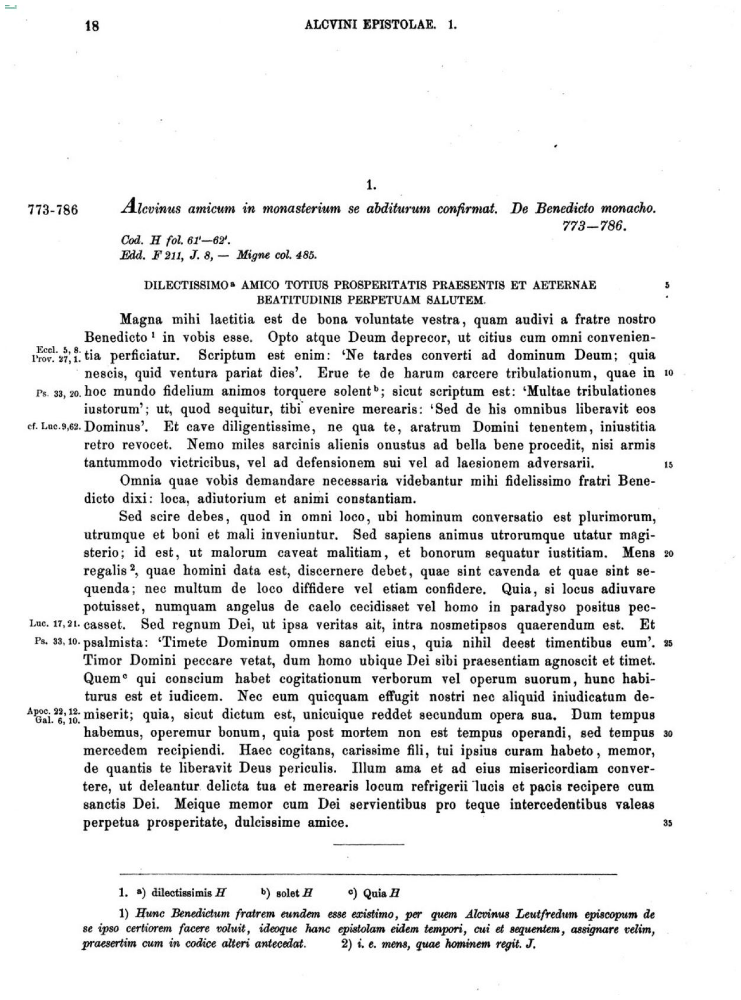

In [6]:
display_image_original_size(image)

In [7]:
# Gray the image
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
print("Gray_image \n",gray)

# BLur the image
blur = cv2.GaussianBlur(gray, (7,7),0)
print("Blur_image \n", blur)

# Threshold the image, black and white the image
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
print("Threhold_image \n", thresh)

Gray_image 
 [[126 123 124 ... 255 255 255]
 [164 161 161 ... 255 255 255]
 [225 221 221 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
Blur_image 
 [[170 170 170 ... 255 255 255]
 [179 179 180 ... 255 255 255]
 [198 198 198 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
Threhold_image 
 [[255 255 255 ...   0   0   0]
 [255 255 255 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]


In [29]:
# Make the kernel
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 50))

# dilate the image
dilate = cv2.dilate(thresh, kernel, iterations = 1)

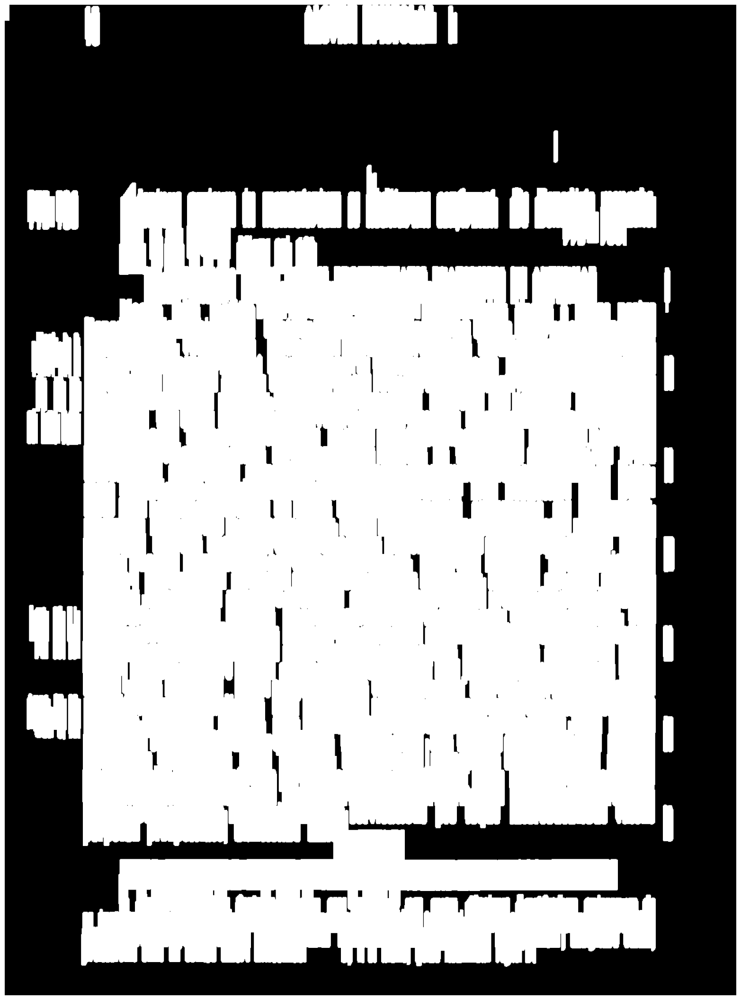

In [30]:
display_image_original_size(dilate)

In [10]:
# Get the Contours
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Depending on the OpenCV version, the return from cv2.findContours could be either:
# 2 elements: (contours, hierarchy)
# 3 elements: (image, contours, hierarchy)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

# sort the contours based on Y values
cnts = sorted(cnts, key = lambda x: cv2.boundingRect(x)[1])

In [11]:
display_contour = image.copy()

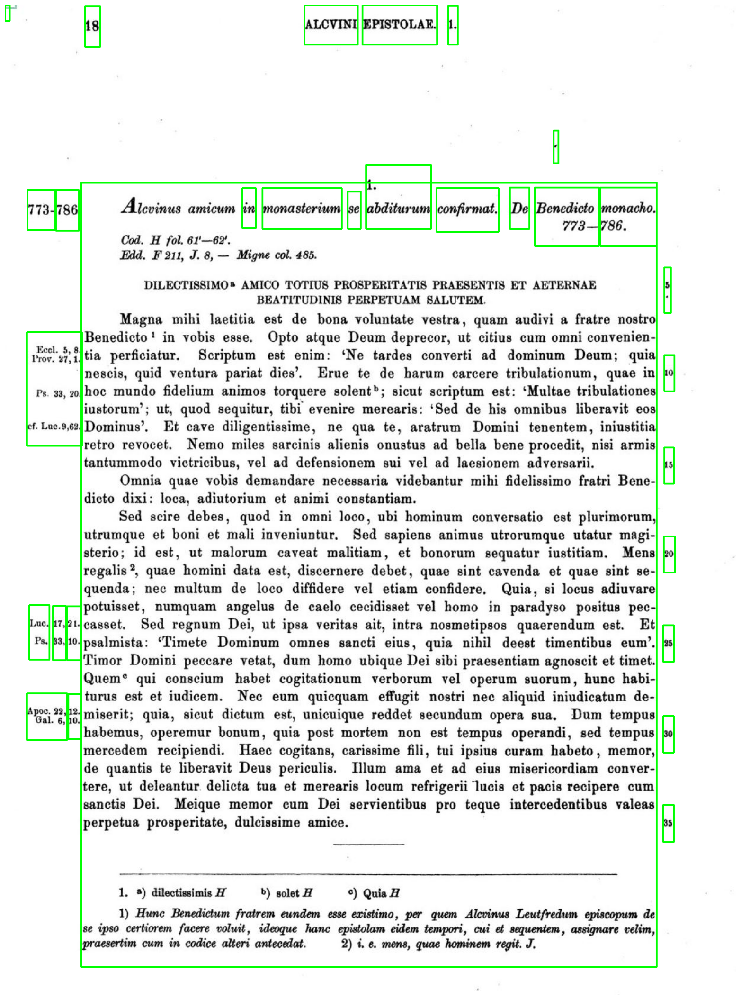

In [13]:
# Draw all the counding box on the image
for c in cnts:
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(display_contour, (x, y), (x+w, y+h), (0,255,0),2)   
 
    
display_image_original_size(display_contour)

(129, 300) (972, 1324) (1101, 1624)


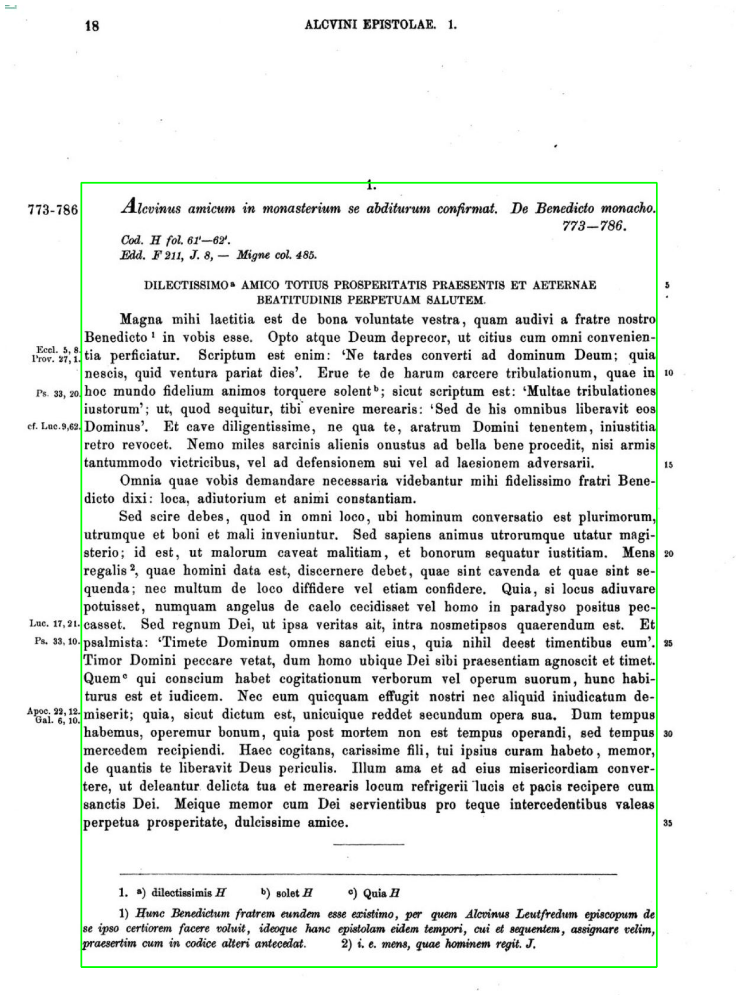

In [77]:
# draw the bounding box only on the body part the image

for c in cnts:
    x, y, w, h = cv2.boundingRect(c)
    if h> 200 and w> 250:
        
        # getting the body part from the base image
        roi = base_image[y:y+h, x: x+w]
        cv2.rectangle(image, (x,y), (x+w, y+h), (0, 255, 0), 2)
        print((x,y),(w,h),(x+w, y+h))
        
display_image_original_size(image)

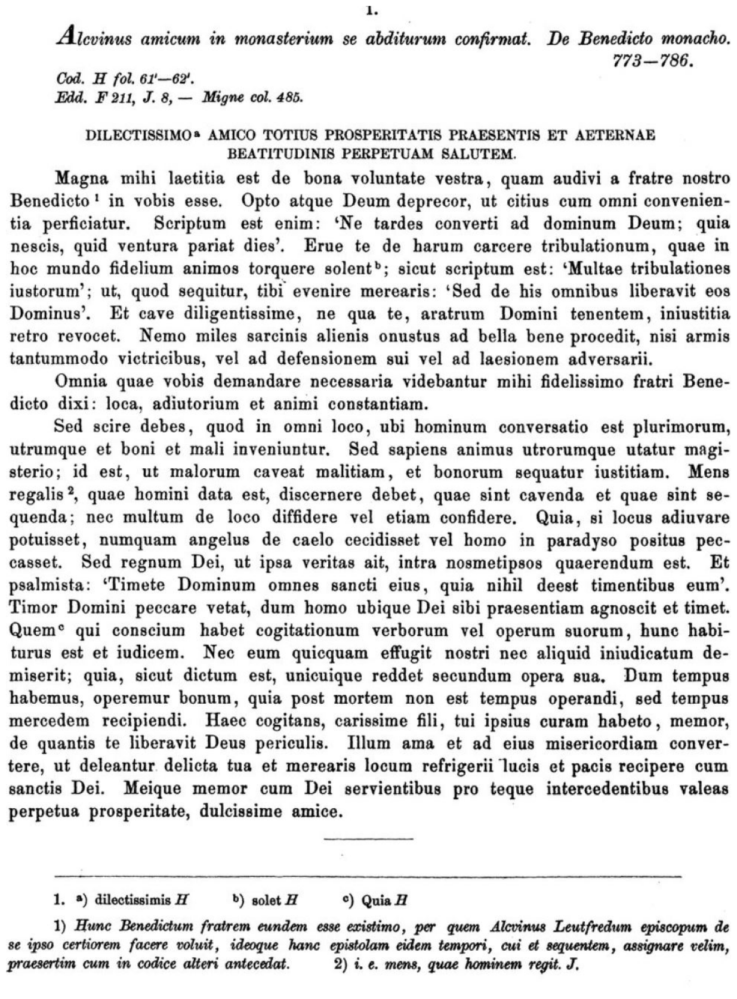

In [60]:
# display the cropped image
display_image_original_size(roi)

In [61]:
# Display the text of the original image using pytesseract
ocr_result_base = pytesseract.image_to_string(base_image)
print(ocr_result_base)

18 ALCVINI EPISTOLAE. 1.

1.

773-786 Alevinus amicum in monasterium se abditurum confirmat. De Benedicto monacho.
773—786.
Cod. H fol. 61'—62'.
Edd. F211, J. 8, — Migne col. 485.

DILECTISSIMO* AMICO TOTIUS PROSPERITATIS PRAESENTIS ET AETERNAE
BEATITUDINIS PERPETUAM SALUTEM.

Magna mihi laetitia est de bona voluntate vestra, quam audivi a fratre nostro

Benedicto! in vobis esse. Opto atque Deum deprecor, ut citius cum omni convenien-

Port tia perficiatur. Scriptum est enim: ‘Ne tardes converti ad dominum Deum; quia
nescis, quid ventura pariat dies’, Erue te de harum carcere tribulationum, quae in

Ps. 33, 20.hoe mundo fidelium animos torquere solent®; sicut scriptum est: ‘Multae tribulationes
iustorum’; ut, quod sequitur, tibi evenire merearis: ‘Sed de his omnibus liberavit eos

cf. Luc.9,62. Dominus’. Et cave diligentissime, ne qua te, aratrum Domini tenentem, iniustitia
retro revocet. Nemo miles sarcinis alienis onustus ad bella bene procedit, nisi armis
tantummodo victricibus, vel

In [62]:
# display the text from the processed image
ocr_result_processed = pytesseract.image_to_string(roi)
print(ocr_result_processed)

ae

Alevinus amicum in monasterium se abditurum confirmat, De Benedicto monacho.
773—786.

Cod. H fol. 61'—62'.

Edd. F211, J. 8, — Migne col. 485.

DILECTISSIMO* AMICO TOTIUS PROSPERITATIS PRAESENTIS ET AETERNAE
BEATITUDINIS PERPETUAM SALUTEM.

Magna mihi laetitia est de bona voluntate vestra, quam audivi a fratre nostro
Benedicto! in vobis esse. Opto atque Deum deprecor, ut citius cum omni convenien-
tia perficiatur. Scriptum est enim: ‘Ne tardes converti ad dominum Deum; quia
nescis, quid ventura pariat dies’, Erue te de harum carcere tribulationum, quae in
hoe mundo fidelium animos torquere solent®; sicut scriptum est: ‘Multae tribulationes
iustorum’; ut, quod sequitur, tibi evenire merearis: ‘Sed de his omnibus liberavit eos
Dominus’. Et cave diligentissime, ne qua te, aratrum Domini tenentem, iniustitia
retro revocet. Nemo miles sarcinis alienis onustus ad bella bene procedit, nisi armis
tantummodo victricibus, vel ad defensionem sui vel ad laesionem adversarii.

Omnia quae vobis

### Get the body seperate from the footnote

In [79]:
# get the image shape
im_h, im_w, im_d = image.shape
im_h, im_w, im_d

(1672, 1236, 3)

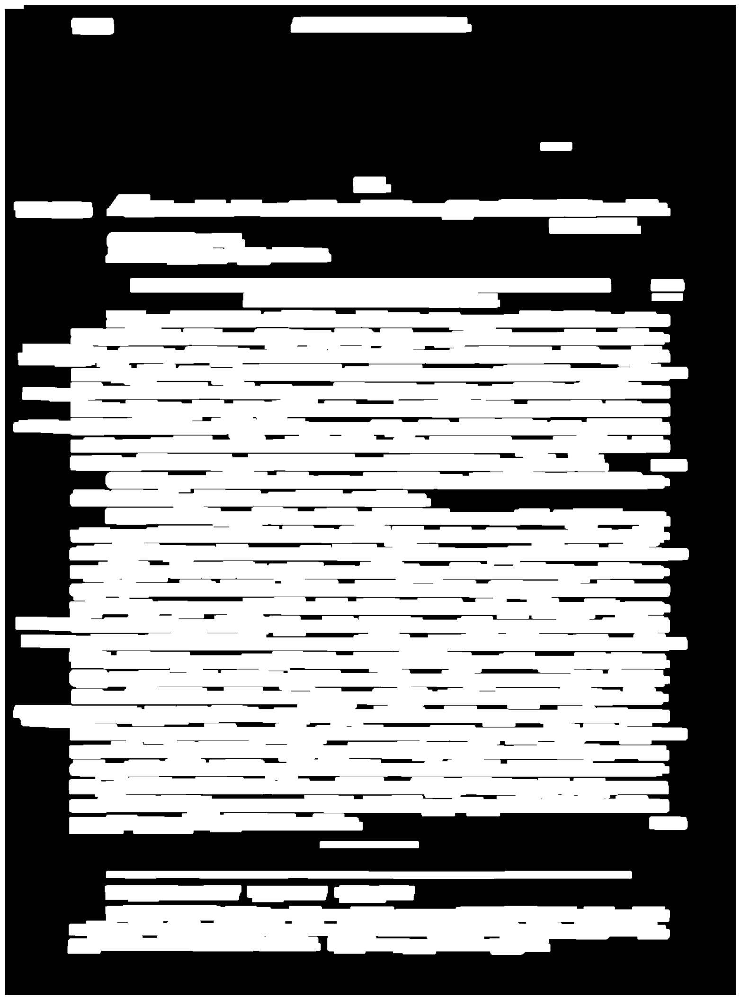

In [34]:
# Create a new kernel and dilate image to extract the line before the footnote
kernel1 = cv2.getStructuringElement(cv2.MORPH_RECT, (50,10))
dilate1 = cv2.dilate(thresh, kernel1, iterations = 1)
display_image_original_size(dilate1)

In [39]:
# Get the Contours corresponsding to new dilated image
cnts1 = cv2.findContours(dilate1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Depending on the OpenCV version, the return from cv2.findContours could be either:
# 2 elements: (contours, hierarchy)
# 3 elements: (image, contours, hierarchy)
cnts1 = cnts1[0] if len(cnts1) == 2 else cnts1[1]

# sort the contours based on Y values
cnts1 = sorted(cnts1, key = lambda x: cv2.boundingRect(x)[1])

(171, 1462) (889, 14) (1060, 1476)


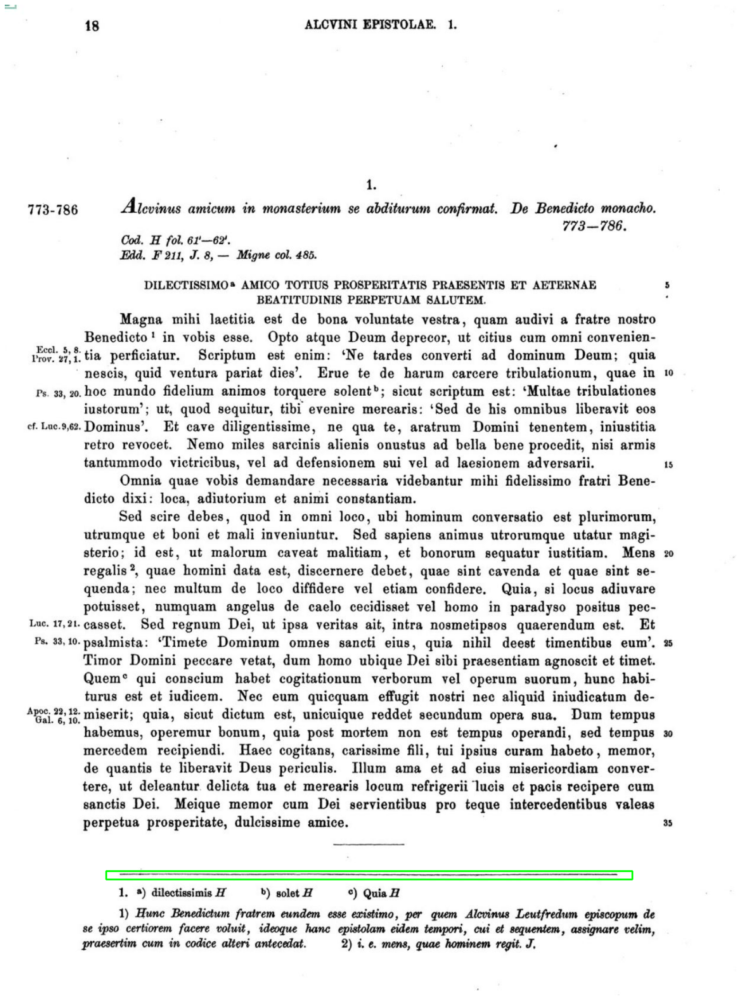

In [87]:
# find the long contour of the line separating the footnot
# make use of contour list created before

draw_line = base_image.copy()

for c in cnts1:
    x, y, w, h = cv2.boundingRect(c)
    
    # condition for line which is thin and long
    if h < 20 and w > 250:
        line = base_image[0:y, :] # Getting the height of the image upto the footnote excluding the line and X axis is fully taken
        cv2.rectangle(draw_line, (x,y), (x+w, y+h),(0, 255, 0), 2)
        print((x,y),(w,h),(x+w, y+h))
        
display_image_original_size(draw_line)

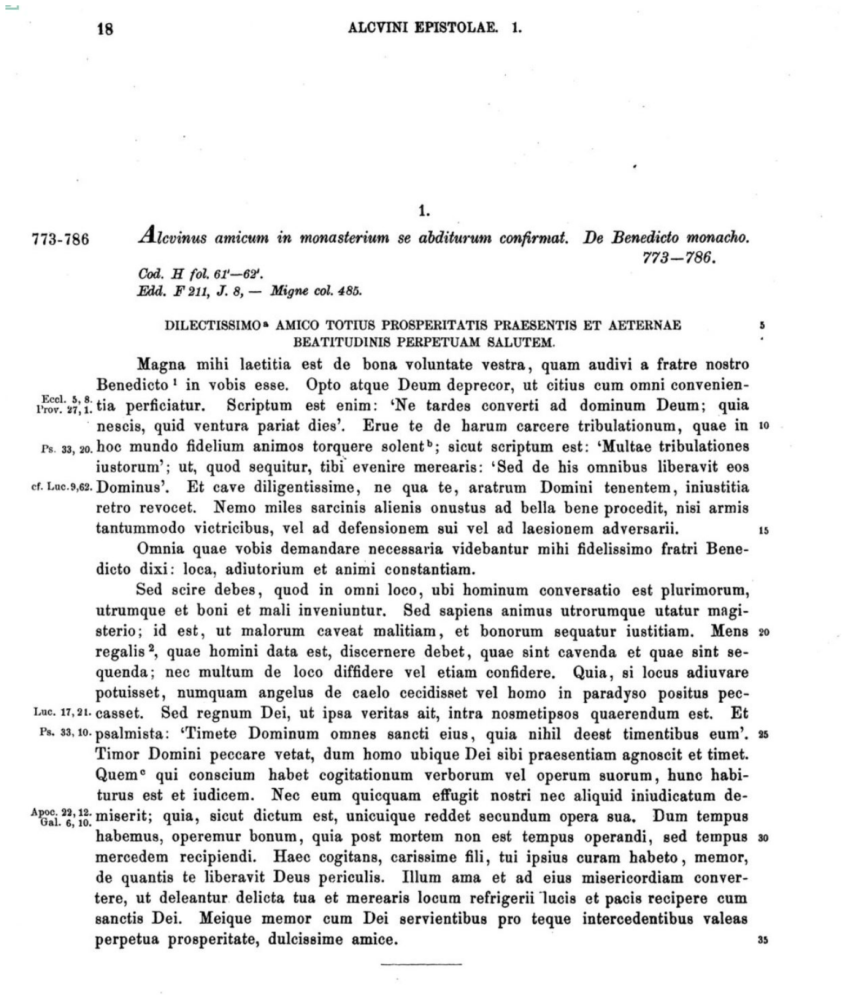

In [88]:
# Image above the line
display_image_original_size(line)

### Get the side notes

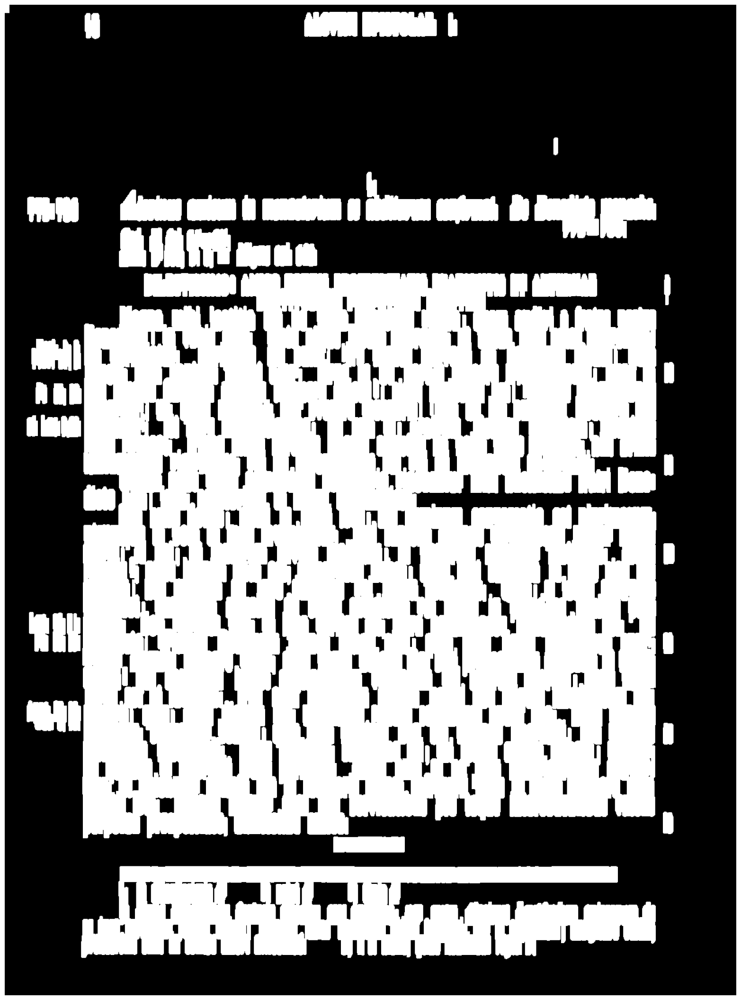

In [42]:
# Create new kernel to get the side notes
kernel2 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 25))
dilate2 = cv2.dilate(thresh, kernel2, iterations = 1)
display_image_original_size(dilate2)

In [43]:
#get the corresponding contours
cnts2 = cv2.findContours(dilate2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts2 = cnts2[0] if len(cnts2) == 2 else cnts[1]
cnts2 = sorted(cnts2, key = lambda x: cv2.boundingRect(x)[1])

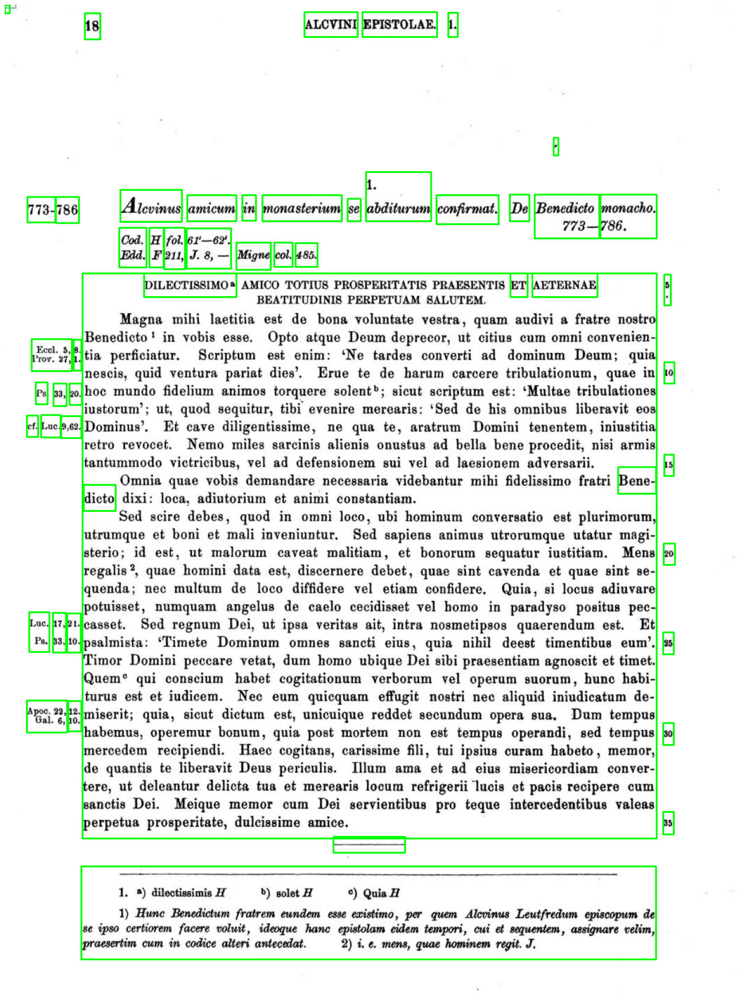

In [100]:
# display all the bounding box corresponding to this dilated image
side_con = base_image.copy()

for c in cnts2:
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(side_con, (x,y), (x+w, y+h), (0,255,0), 2)
    
display_image_original_size(side_con)

In [123]:
side_image = base_image.copy()


for c in cnts2:
    x, y, w, h = cv2.boundingRect(c)
    
    # Check for y value too so that it won't check below a certain point
    if h > 150 and w > 250 and y< 1450:
        sides = base_image[y:y+h, 0:x]
        cv2.rectangle(side_image, (0,y), (x, y+h), (0,255,0), 2)


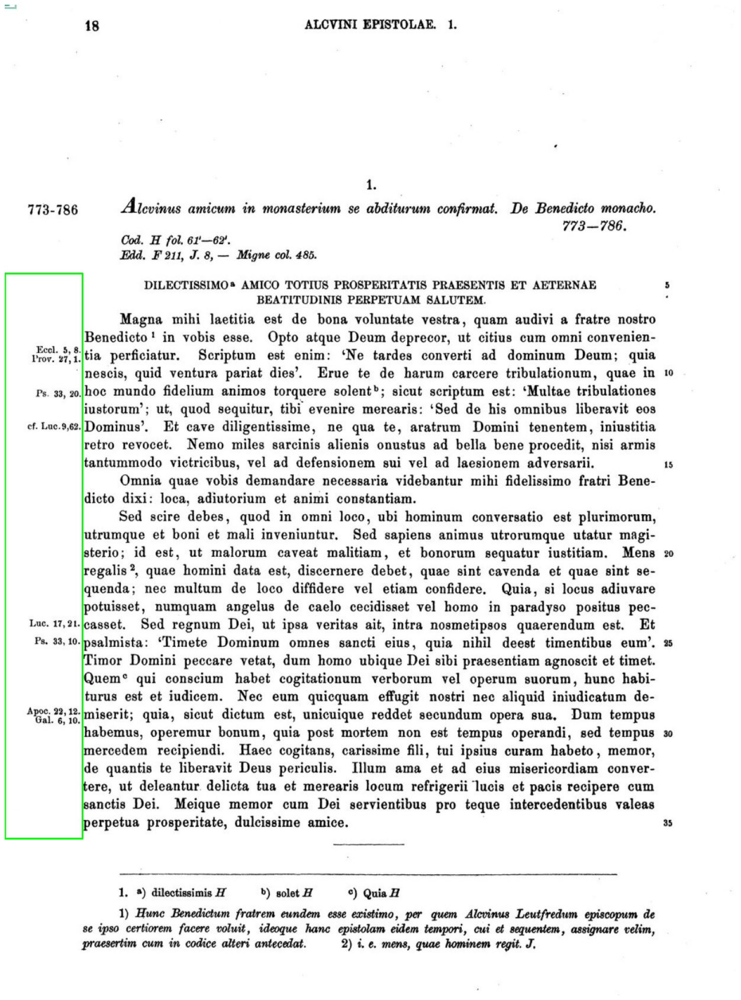

In [124]:
display_image_original_size(side_image)

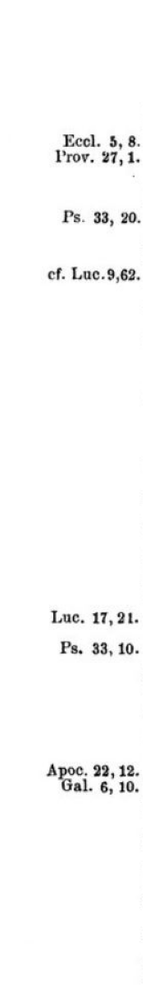

In [122]:
 display_image_original_size(sides)

In [126]:
ocr_side_result = pytesseract.image_to_string(sides)
print(ocr_side_result)

Feel. 5, 8.
Vrov. 87, 1.

Ps. 33, 20.

cf. Lue. 9,62.

Lue. 17,21.
Ps. 33, 10.

Apoc. 92, 12.
6, 10.


